In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import torchvision.transforms as transforms
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
os.chdir('/content/drive/MyDrive/spring2023/cmsc472/group_project/GazeChange')

In [5]:
%ls

 saved_loaders/   src/  'TrainingLoop (1).ipynb'   Untitled


In [6]:
%run -i "./src/MPIIFaceGazeDataset"
%run -i "./src/GAN"

In [7]:
cuda = True if torch.cuda.is_available() else False

In [8]:
# Number of training epochs
num_epochs = 35
# Learning rate for optimizers
lr = 0.0002
# Beta1 hyperparameter for Adam optimizers
beta1 = 0.5
beta2 = 0.999
# Number of workers for dataloader
workers = 2
batch_size = 512
sample_interval = 400
# do not train disc
wait_disc=10
# learning rate max step
t_max=200

In [ ]:
# def plot_images(imgs,n_row=4,n_col=4):
#   _, axs = plt.subplots(n_row, n_col, figsize=(12, 12))
#   axs = axs.flatten()
#   for img, ax in zip(imgs, axs):
#       ax.imshow(img.detach().permute(1, 2, 0))
#   plt.show()

In [9]:
def plot_images(imgs,title='Fake Images',rows=5,num_images=25):
  # Plot the real images
  plt.figure(figsize=(15,15))
  plt.subplot(1,2,1)
  plt.axis("off")
  plt.title(title)
  # imgs_for_grid = imgs[0]
  plt.imshow(np.transpose(torchvision.utils.make_grid(imgs[:num_images],nrow=rows, padding=5, normalize=True).cpu(),(1,2,0)))
  plt.show()

In [10]:
#to save computation time
def get_cropped_eyes(train_dataloader,val_dataloder):
  train_eyes = []
  val_eyes = []
  for i, (real_imgs,labels) in enumerate(train_dataloader):
    real_imgs, labels = real_imgs.to(device), labels.to(device)
    eyes = crop_eyes(real_imgs, labels)
    train_eyes.append(eyes)
  for i, (real_imgs,labels) in enumerate(val_dataloader):
    real_imgs, labels = real_imgs.to(device), labels.to(device)
    eyes = crop_eyes(real_imgs, labels)
    val_eyes.append(eyes)

  return (train_eyes,val_eyes)

In [11]:
train_dataloader, val_dataloader = get_dataloaders(batch_size)

In [ ]:
# torch.save(train_dataloader, 'saved_loaders/train_dataloader.pth')
# torch.save(val_dataloader, 'saved_loaders/train_dataloader.pth')

In [12]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
Tensor = torch.cuda.FloatTensor if cuda else torch.FloatTensor

In [17]:
# train_eyes, val_eyes =  get_cropped_eyes(train_dataloader, val_dataloader)

In [ ]:
# torch.save(train_eyes, 'saved_loaders/train_eyes.pth')
# torch.save(val_eyes, 'saved_loaders/val_eyes.pth')

In [13]:
train_eyes = torch.load('saved_loaders/train_eyes.pth')
val_eyes = torch.load('saved_loaders/val_eyes.pth')

# train_dataloader = torch.load('saved_loaders/train_dataloader.pth')
# val_dataloader = torch.load('saved_loaders/val_dataloader.pth')

In [19]:
gen = Generator()
disc = Discriminator()
gen = gen.cuda()
disc = disc.cuda()
pixelwise_loss = nn.L1Loss()
adverserial_loss = nn.BCELoss()
opt_g = torch.optim.Adam(gen.parameters(),lr=lr,betas=(beta1, beta2))
opt_d = torch.optim.Adam(disc.parameters(),lr=lr,betas=(beta1, beta2))
# opt_g = torch.optim.Adam(gen.parameters(),lr=lr,betas=(beta1, beta2),weight_decay=1e-5)
# opt_d = torch.optim.Adam(disc.parameters(),lr=lr,betas=(beta1, beta2),weight_decay=1e-5)


# scheduler_g = torch.optim.lr_scheduler.CosineAnnealingLR(
#         opt_g, T_max=t_max
#      )

# scheduler_d = torch.optim.lr_scheduler.OneCycleLR(
#     opt_d, max_lr=1e-3, steps_per_epoch=len(train_dataloader), epochs=num_epochs
# )

Training [Epoch 0/35] [Batch 0/11] [D loss: 0.016496] [G loss: 0.013913]


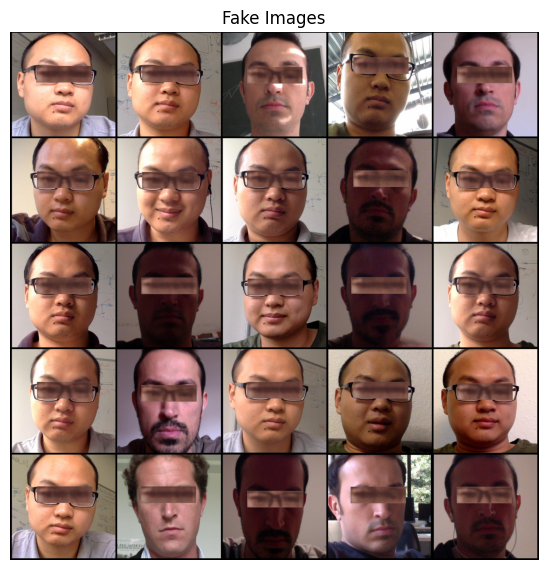

Training [Epoch 0/35] [Batch 1/11] [D loss: 0.013704] [G loss: 0.014125]
Training [Epoch 0/35] [Batch 2/11] [D loss: 0.038015] [G loss: 0.013999]
Training [Epoch 0/35] [Batch 3/11] [D loss: 0.020432] [G loss: 0.014018]
Training [Epoch 0/35] [Batch 4/11] [D loss: 0.008682] [G loss: 0.014141]
Training [Epoch 0/35] [Batch 5/11] [D loss: 0.013203] [G loss: 0.013581]
Training [Epoch 0/35] [Batch 6/11] [D loss: 0.014979] [G loss: 0.014010]
Training [Epoch 0/35] [Batch 7/11] [D loss: 0.023116] [G loss: 0.014014]
Training [Epoch 0/35] [Batch 8/11] [D loss: 0.038379] [G loss: 0.014001]
Training [Epoch 0/35] [Batch 9/11] [D loss: 0.037847] [G loss: 0.013821]
Training [Epoch 0/35] [Batch 10/11] [D loss: 0.021039] [G loss: 0.013600]

Validatio [Epoch 0/35] [Batch 0/11] [D loss: 0.126060] [G loss: 0.018065]
Validation Generated Outputs


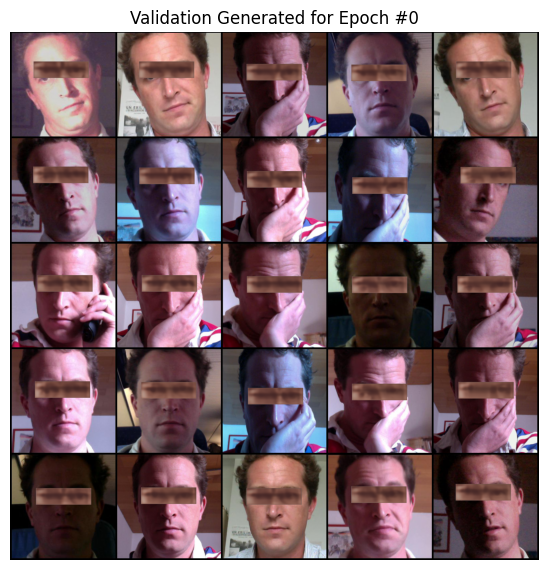

Validatio [Epoch 0/35] [Batch 1/11] [D loss: 0.121934] [G loss: 0.017998]
Validatio [Epoch 0/35] [Batch 2/11] [D loss: 0.092009] [G loss: 0.018185]
Training [Epoch 1/35] [Batch 0/11] [D loss: 0.021954] [G loss: 0.013800]


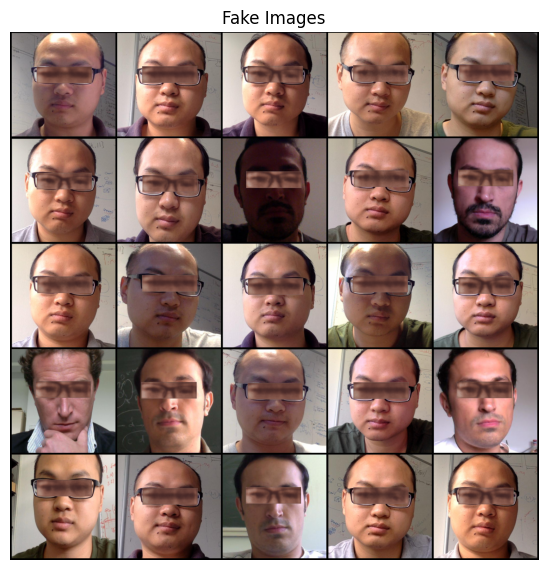

Training [Epoch 1/35] [Batch 1/11] [D loss: 0.032617] [G loss: 0.014173]
Training [Epoch 1/35] [Batch 2/11] [D loss: 0.026218] [G loss: 0.014151]
Training [Epoch 1/35] [Batch 3/11] [D loss: 0.017437] [G loss: 0.014013]
Training [Epoch 1/35] [Batch 4/11] [D loss: 0.009731] [G loss: 0.013989]
Training [Epoch 1/35] [Batch 5/11] [D loss: 0.019419] [G loss: 0.013831]
Training [Epoch 1/35] [Batch 6/11] [D loss: 0.020584] [G loss: 0.013698]
Training [Epoch 1/35] [Batch 7/11] [D loss: 0.022471] [G loss: 0.014060]
Training [Epoch 1/35] [Batch 8/11] [D loss: 0.019005] [G loss: 0.013853]
Training [Epoch 1/35] [Batch 9/11] [D loss: 0.026038] [G loss: 0.013933]
Training [Epoch 1/35] [Batch 10/11] [D loss: 0.035872] [G loss: 0.013829]

Validatio [Epoch 1/35] [Batch 0/11] [D loss: 0.106738] [G loss: 0.018138]
Validation Generated Outputs


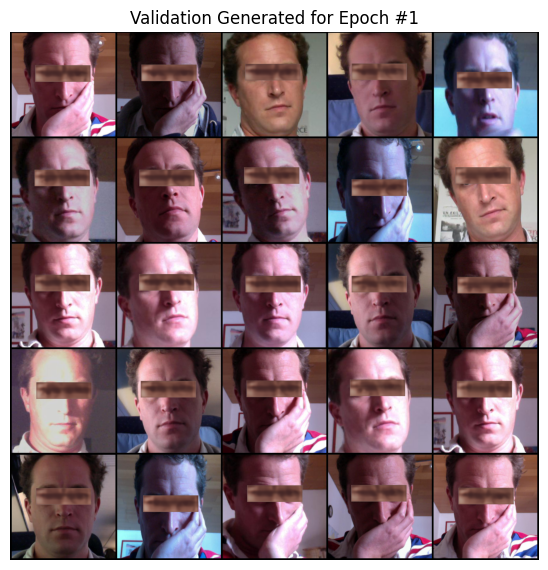

Validatio [Epoch 1/35] [Batch 1/11] [D loss: 0.153423] [G loss: 0.017671]
Validatio [Epoch 1/35] [Batch 2/11] [D loss: 0.110774] [G loss: 0.018532]
Training [Epoch 2/35] [Batch 0/11] [D loss: 0.019708] [G loss: 0.013737]


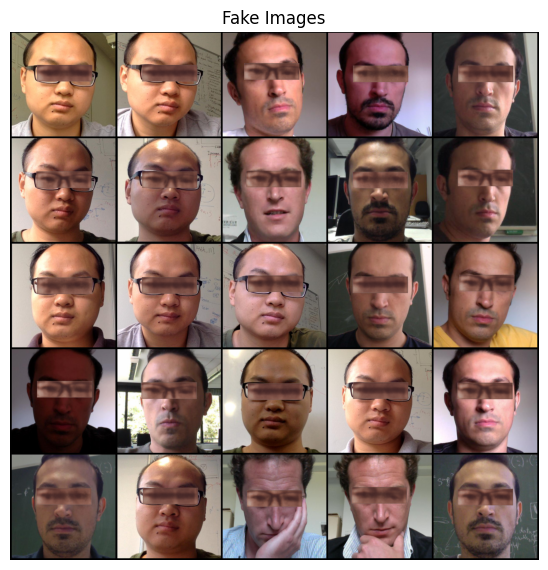

Training [Epoch 2/35] [Batch 1/11] [D loss: 0.012922] [G loss: 0.013944]
Training [Epoch 2/35] [Batch 2/11] [D loss: 0.032822] [G loss: 0.014065]
Training [Epoch 2/35] [Batch 3/11] [D loss: 0.017851] [G loss: 0.013816]
Training [Epoch 2/35] [Batch 4/11] [D loss: 0.023496] [G loss: 0.013568]
Training [Epoch 2/35] [Batch 5/11] [D loss: 0.010473] [G loss: 0.014166]
Training [Epoch 2/35] [Batch 6/11] [D loss: 0.014487] [G loss: 0.013886]
Training [Epoch 2/35] [Batch 7/11] [D loss: 0.027603] [G loss: 0.013959]
Training [Epoch 2/35] [Batch 8/11] [D loss: 0.037465] [G loss: 0.014156]
Training [Epoch 2/35] [Batch 9/11] [D loss: 0.015031] [G loss: 0.014002]
Training [Epoch 2/35] [Batch 10/11] [D loss: 0.034252] [G loss: 0.013934]

Validatio [Epoch 2/35] [Batch 0/11] [D loss: 0.159663] [G loss: 0.018529]
Validation Generated Outputs


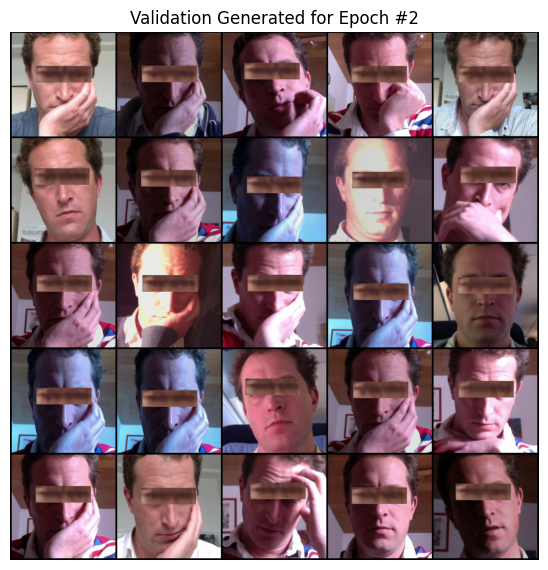

Validatio [Epoch 2/35] [Batch 1/11] [D loss: 0.140449] [G loss: 0.018935]
Validatio [Epoch 2/35] [Batch 2/11] [D loss: 0.026891] [G loss: 0.018360]
Training [Epoch 3/35] [Batch 0/11] [D loss: 0.023007] [G loss: 0.013723]


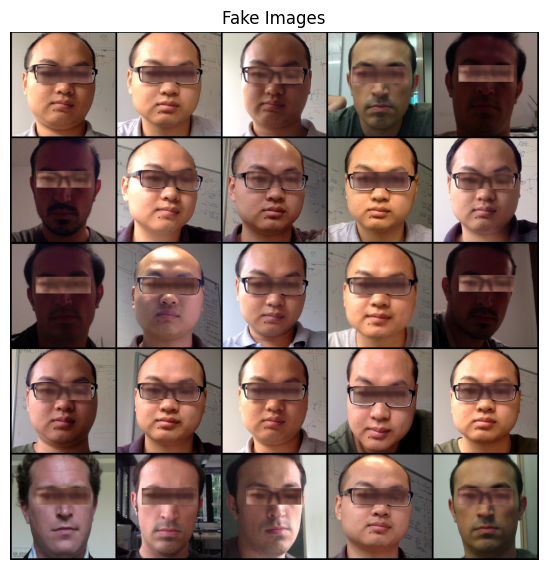

Training [Epoch 3/35] [Batch 1/11] [D loss: 0.033336] [G loss: 0.014009]
Training [Epoch 3/35] [Batch 2/11] [D loss: 0.031012] [G loss: 0.013629]
Training [Epoch 3/35] [Batch 3/11] [D loss: 0.016717] [G loss: 0.014241]
Training [Epoch 3/35] [Batch 4/11] [D loss: 0.015253] [G loss: 0.014015]
Training [Epoch 3/35] [Batch 5/11] [D loss: 0.008690] [G loss: 0.014074]
Training [Epoch 3/35] [Batch 6/11] [D loss: 0.015663] [G loss: 0.013933]
Training [Epoch 3/35] [Batch 7/11] [D loss: 0.019255] [G loss: 0.014163]
Training [Epoch 3/35] [Batch 8/11] [D loss: 0.019869] [G loss: 0.013762]
Training [Epoch 3/35] [Batch 9/11] [D loss: 0.017618] [G loss: 0.013922]
Training [Epoch 3/35] [Batch 10/11] [D loss: 0.024526] [G loss: 0.013733]

Validatio [Epoch 3/35] [Batch 0/11] [D loss: 0.126821] [G loss: 0.018271]
Validation Generated Outputs


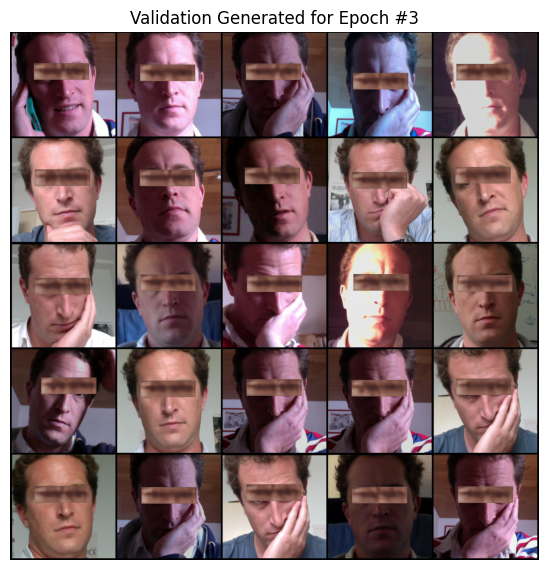

Validatio [Epoch 3/35] [Batch 1/11] [D loss: 0.125742] [G loss: 0.017952]
Validatio [Epoch 3/35] [Batch 2/11] [D loss: 0.099693] [G loss: 0.018719]
Training [Epoch 4/35] [Batch 0/11] [D loss: 0.043614] [G loss: 0.014006]


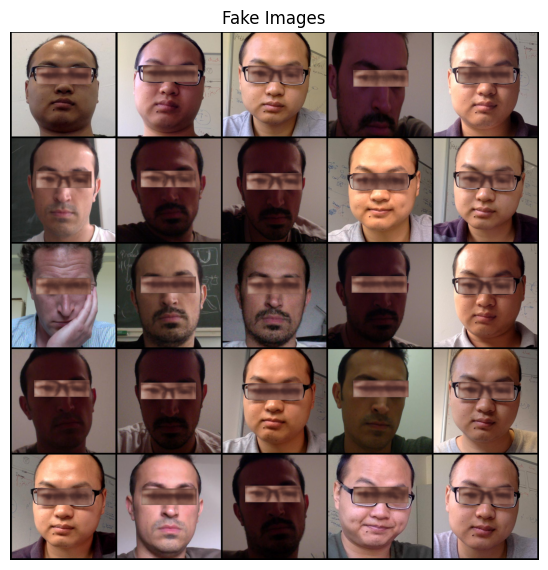

Training [Epoch 4/35] [Batch 1/11] [D loss: 0.022132] [G loss: 0.014071]
Training [Epoch 4/35] [Batch 2/11] [D loss: 0.037302] [G loss: 0.013965]
Training [Epoch 4/35] [Batch 3/11] [D loss: 0.021156] [G loss: 0.014081]
Training [Epoch 4/35] [Batch 4/11] [D loss: 0.017398] [G loss: 0.013963]
Training [Epoch 4/35] [Batch 5/11] [D loss: 0.011157] [G loss: 0.013883]
Training [Epoch 4/35] [Batch 6/11] [D loss: 0.014364] [G loss: 0.013892]
Training [Epoch 4/35] [Batch 7/11] [D loss: 0.016528] [G loss: 0.014237]
Training [Epoch 4/35] [Batch 8/11] [D loss: 0.014009] [G loss: 0.013821]
Training [Epoch 4/35] [Batch 9/11] [D loss: 0.012762] [G loss: 0.014024]
Training [Epoch 4/35] [Batch 10/11] [D loss: 0.008036] [G loss: 0.013495]

Validatio [Epoch 4/35] [Batch 0/11] [D loss: 0.132971] [G loss: 0.018966]
Validation Generated Outputs


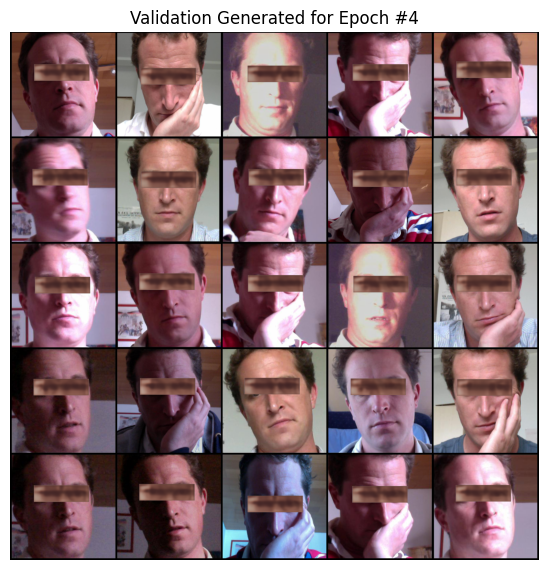

Validatio [Epoch 4/35] [Batch 1/11] [D loss: 0.106373] [G loss: 0.018630]
Validatio [Epoch 4/35] [Batch 2/11] [D loss: 0.080730] [G loss: 0.018446]
Training [Epoch 5/35] [Batch 0/11] [D loss: 0.028956] [G loss: 0.014136]


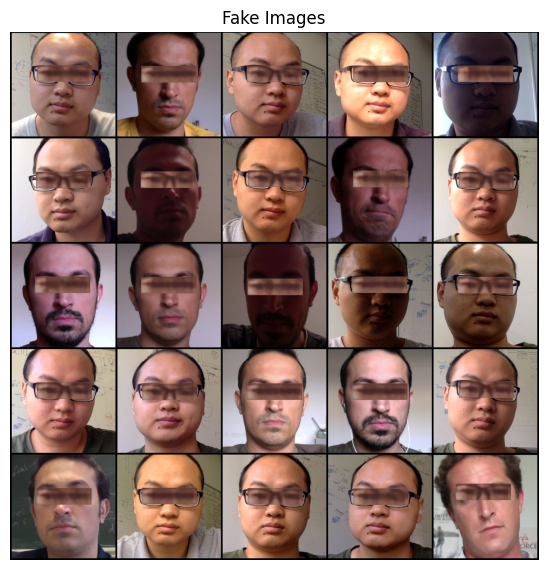

Training [Epoch 5/35] [Batch 1/11] [D loss: 0.010925] [G loss: 0.013689]
Training [Epoch 5/35] [Batch 2/11] [D loss: 0.033416] [G loss: 0.013914]
Training [Epoch 5/35] [Batch 3/11] [D loss: 0.014270] [G loss: 0.013770]
Training [Epoch 5/35] [Batch 4/11] [D loss: 0.019885] [G loss: 0.013741]
Training [Epoch 5/35] [Batch 5/11] [D loss: 0.010886] [G loss: 0.013980]
Training [Epoch 5/35] [Batch 6/11] [D loss: 0.018426] [G loss: 0.014080]
Training [Epoch 5/35] [Batch 7/11] [D loss: 0.009838] [G loss: 0.014024]
Training [Epoch 5/35] [Batch 8/11] [D loss: 0.019904] [G loss: 0.014146]
Training [Epoch 5/35] [Batch 9/11] [D loss: 0.027555] [G loss: 0.013818]
Training [Epoch 5/35] [Batch 10/11] [D loss: 0.016245] [G loss: 0.013785]

Validatio [Epoch 5/35] [Batch 0/11] [D loss: 0.100523] [G loss: 0.018352]
Validation Generated Outputs


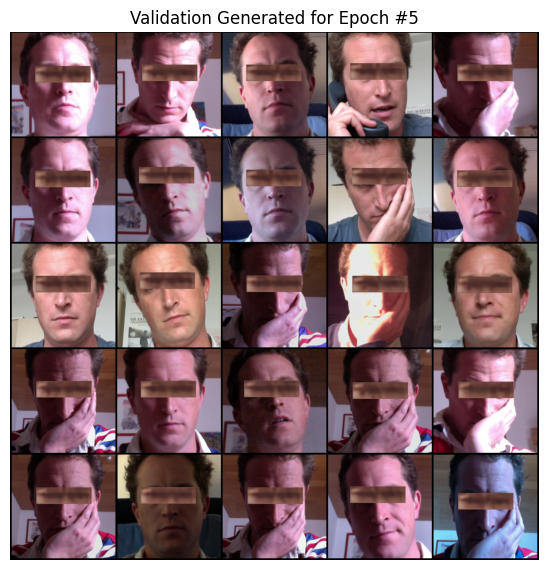

Validatio [Epoch 5/35] [Batch 1/11] [D loss: 0.118989] [G loss: 0.018729]
Validatio [Epoch 5/35] [Batch 2/11] [D loss: 0.149754] [G loss: 0.018518]
Training [Epoch 6/35] [Batch 0/11] [D loss: 0.012603] [G loss: 0.013856]


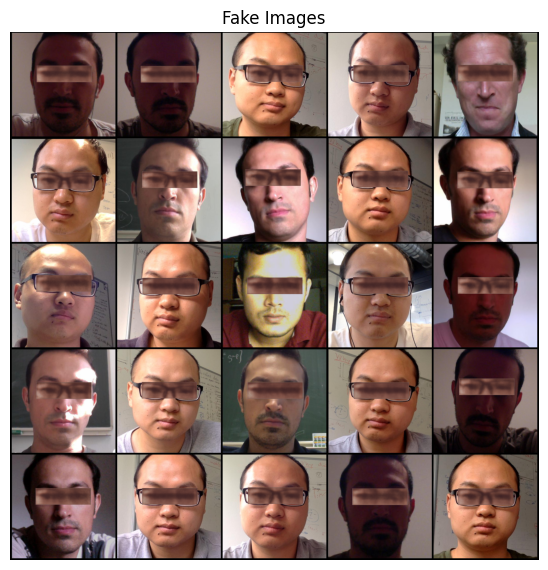

Training [Epoch 6/35] [Batch 1/11] [D loss: 0.018887] [G loss: 0.013847]
Training [Epoch 6/35] [Batch 2/11] [D loss: 0.012260] [G loss: 0.013736]
Training [Epoch 6/35] [Batch 3/11] [D loss: 0.016551] [G loss: 0.013995]
Training [Epoch 6/35] [Batch 4/11] [D loss: 0.019839] [G loss: 0.014030]
Training [Epoch 6/35] [Batch 5/11] [D loss: 0.028982] [G loss: 0.014143]
Training [Epoch 6/35] [Batch 6/11] [D loss: 0.019302] [G loss: 0.013638]
Training [Epoch 6/35] [Batch 7/11] [D loss: 0.024427] [G loss: 0.014172]
Training [Epoch 6/35] [Batch 8/11] [D loss: 0.020729] [G loss: 0.013897]
Training [Epoch 6/35] [Batch 9/11] [D loss: 0.016345] [G loss: 0.014098]
Training [Epoch 6/35] [Batch 10/11] [D loss: 0.014862] [G loss: 0.013458]

Validatio [Epoch 6/35] [Batch 0/11] [D loss: 0.110423] [G loss: 0.019133]
Validation Generated Outputs


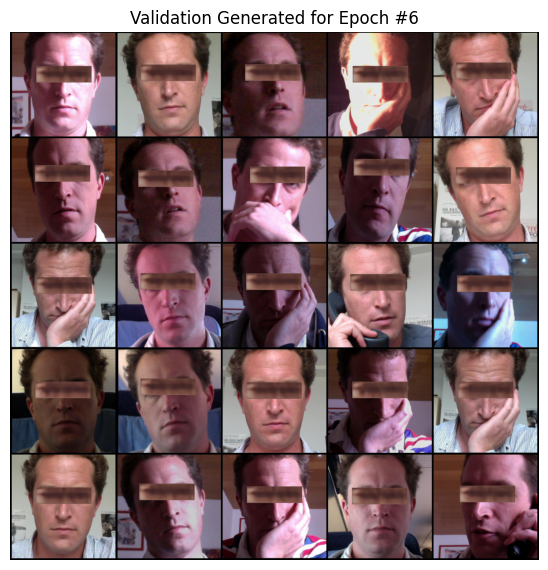

Validatio [Epoch 6/35] [Batch 1/11] [D loss: 0.172128] [G loss: 0.018928]
Validatio [Epoch 6/35] [Batch 2/11] [D loss: 0.092236] [G loss: 0.018772]
Training [Epoch 7/35] [Batch 0/11] [D loss: 0.016952] [G loss: 0.013802]


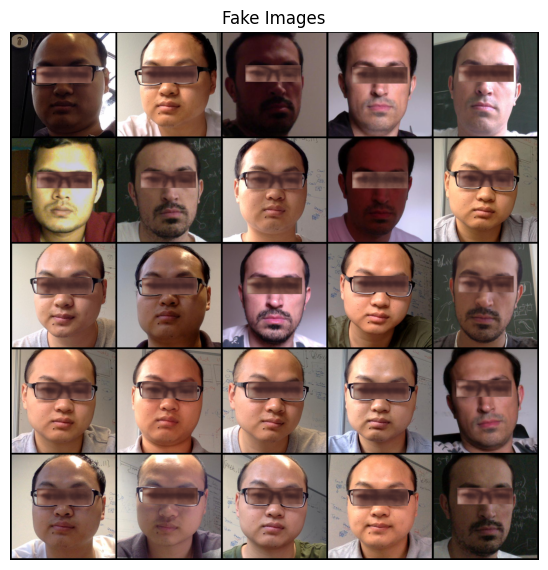

Training [Epoch 7/35] [Batch 1/11] [D loss: 0.011359] [G loss: 0.014031]
Training [Epoch 7/35] [Batch 2/11] [D loss: 0.013125] [G loss: 0.014077]
Training [Epoch 7/35] [Batch 3/11] [D loss: 0.014709] [G loss: 0.013663]
Training [Epoch 7/35] [Batch 4/11] [D loss: 0.016031] [G loss: 0.013717]
Training [Epoch 7/35] [Batch 5/11] [D loss: 0.009308] [G loss: 0.013851]
Training [Epoch 7/35] [Batch 6/11] [D loss: 0.027896] [G loss: 0.013867]
Training [Epoch 7/35] [Batch 7/11] [D loss: 0.015659] [G loss: 0.013727]
Training [Epoch 7/35] [Batch 8/11] [D loss: 0.035635] [G loss: 0.014092]
Training [Epoch 7/35] [Batch 9/11] [D loss: 0.026640] [G loss: 0.014065]
Training [Epoch 7/35] [Batch 10/11] [D loss: 0.016184] [G loss: 0.014105]

Validatio [Epoch 7/35] [Batch 0/11] [D loss: 0.099776] [G loss: 0.018734]
Validation Generated Outputs


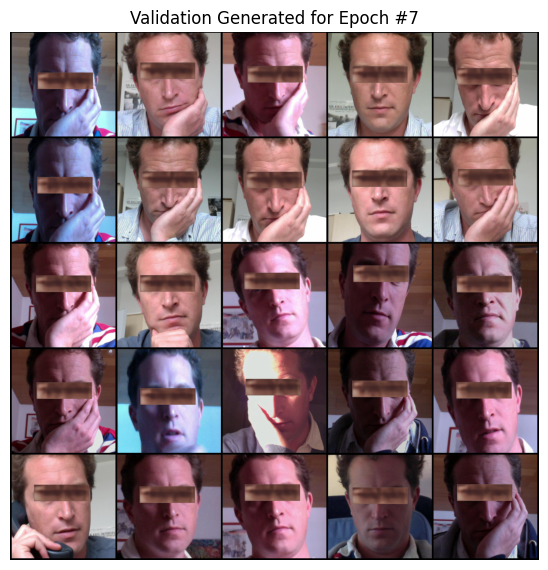

Validatio [Epoch 7/35] [Batch 1/11] [D loss: 0.138046] [G loss: 0.018974]
Validatio [Epoch 7/35] [Batch 2/11] [D loss: 0.087141] [G loss: 0.018421]
Training [Epoch 8/35] [Batch 0/11] [D loss: 0.009995] [G loss: 0.014137]


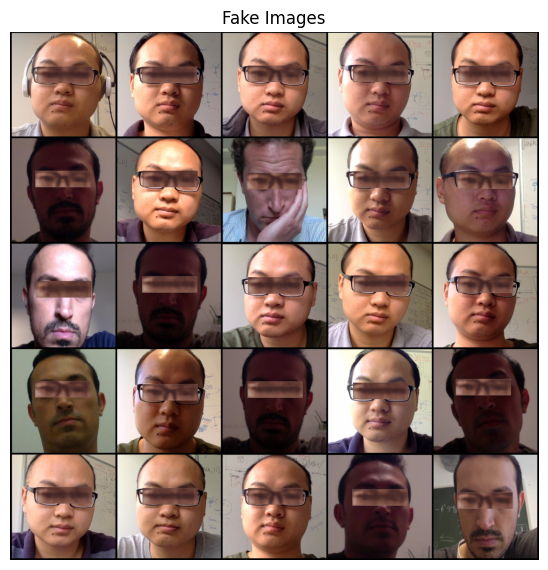

Training [Epoch 8/35] [Batch 1/11] [D loss: 0.021968] [G loss: 0.014096]
Training [Epoch 8/35] [Batch 2/11] [D loss: 0.020325] [G loss: 0.013874]
Training [Epoch 8/35] [Batch 3/11] [D loss: 0.024440] [G loss: 0.013734]
Training [Epoch 8/35] [Batch 4/11] [D loss: 0.010824] [G loss: 0.013789]
Training [Epoch 8/35] [Batch 5/11] [D loss: 0.018239] [G loss: 0.013648]
Training [Epoch 8/35] [Batch 6/11] [D loss: 0.024934] [G loss: 0.013929]
Training [Epoch 8/35] [Batch 7/11] [D loss: 0.017884] [G loss: 0.013757]
Training [Epoch 8/35] [Batch 8/11] [D loss: 0.018739] [G loss: 0.013896]
Training [Epoch 8/35] [Batch 9/11] [D loss: 0.015714] [G loss: 0.014068]
Training [Epoch 8/35] [Batch 10/11] [D loss: 0.004334] [G loss: 0.013812]

Validatio [Epoch 8/35] [Batch 0/11] [D loss: 0.130523] [G loss: 0.018728]
Validation Generated Outputs


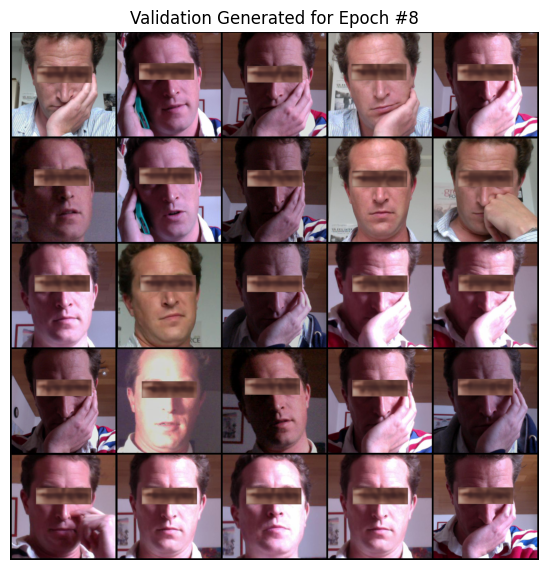

Validatio [Epoch 8/35] [Batch 1/11] [D loss: 0.116390] [G loss: 0.019058]
Validatio [Epoch 8/35] [Batch 2/11] [D loss: 0.058171] [G loss: 0.018840]
Training [Epoch 9/35] [Batch 0/11] [D loss: 0.014221] [G loss: 0.013572]


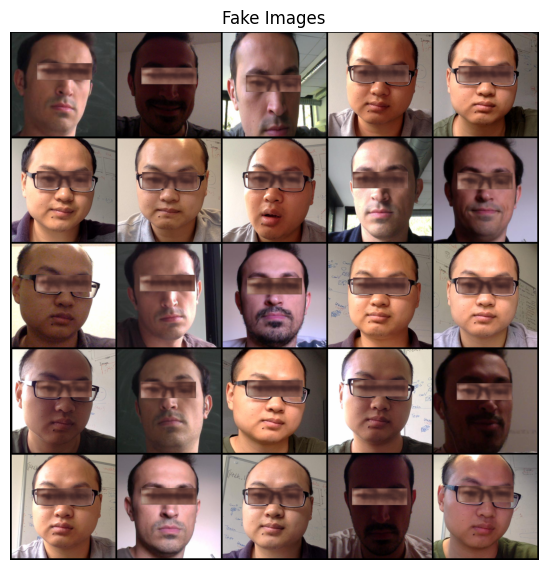

Training [Epoch 9/35] [Batch 1/11] [D loss: 0.011474] [G loss: 0.014172]
Training [Epoch 9/35] [Batch 2/11] [D loss: 0.010988] [G loss: 0.013886]
Training [Epoch 9/35] [Batch 3/11] [D loss: 0.016075] [G loss: 0.014321]
Training [Epoch 9/35] [Batch 4/11] [D loss: 0.019743] [G loss: 0.013903]
Training [Epoch 9/35] [Batch 5/11] [D loss: 0.025254] [G loss: 0.014038]
Training [Epoch 9/35] [Batch 6/11] [D loss: 0.024893] [G loss: 0.013595]
Training [Epoch 9/35] [Batch 7/11] [D loss: 0.018847] [G loss: 0.013777]
Training [Epoch 9/35] [Batch 8/11] [D loss: 0.021467] [G loss: 0.013880]
Training [Epoch 9/35] [Batch 9/11] [D loss: 0.011344] [G loss: 0.013639]
Training [Epoch 9/35] [Batch 10/11] [D loss: 0.032974] [G loss: 0.013856]

Validatio [Epoch 9/35] [Batch 0/11] [D loss: 0.151715] [G loss: 0.018869]
Validation Generated Outputs


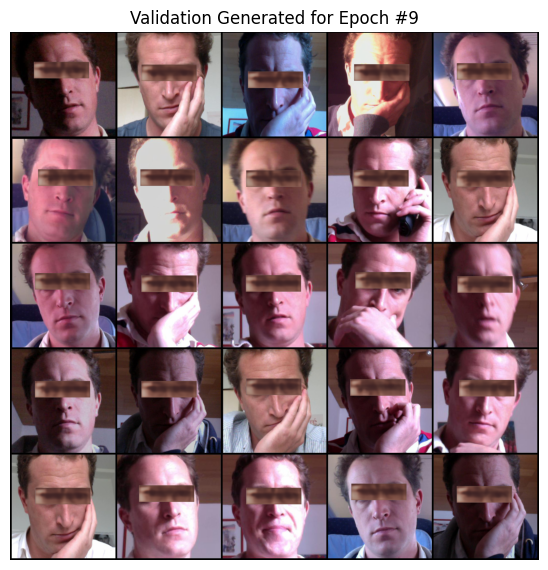

Validatio [Epoch 9/35] [Batch 1/11] [D loss: 0.082213] [G loss: 0.019329]
Validatio [Epoch 9/35] [Batch 2/11] [D loss: 0.121902] [G loss: 0.019149]
Training [Epoch 10/35] [Batch 0/11] [D loss: 0.012478] [G loss: 0.014061]


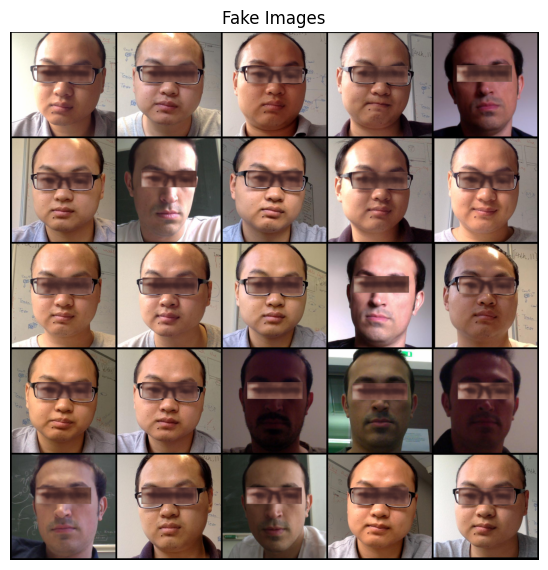

Training [Epoch 10/35] [Batch 1/11] [D loss: 0.015495] [G loss: 0.014094]


In [ ]:
# ----------
#  Training
# ----------

for epoch in range(num_epochs):
    gen.train()
    disc.train()

    train_g_loss = []
    val_g_loss = []
    train_d_loss = []
    val_d_loss = []
    plt_imgs = None
    for i, (real_imgs,labels) in enumerate(train_dataloader):
        real_imgs, labels = real_imgs.to(device), labels.to(device)

        # Adversarial ground truths
        valid = Variable(Tensor(real_imgs.size(0), 1).fill_(1.0), requires_grad=False)
        fake = Variable(Tensor(real_imgs.size(0), 1).fill_(0.0), requires_grad=False)

        valid.to(device)
        fake.to(device)
        
        # -----------------
        #  Train Generator
        # -----------------

        opt_g.zero_grad()

        # Sample noise as generator input
        # eyes = crop_eyes(real_imgs, labels)
        eyes = train_eyes[i]

        # Generate a batch of images
        gen_eyes = gen(eyes)
        gen_imgs = insert_eyes(real_imgs, labels, gen_eyes)
        
        # Loss measures generator's ability to fool the discriminator
        # g_loss = BCE_loss(disc(gen_imgs), valid)
        g_loss = pixelwise_loss(gen_imgs, real_imgs)

        train_g_loss.append(g_loss.item())
        g_loss.backward()
        opt_g.step()
        # scheduler_g.step()
        
        # if epoch % 1 == 0:
          # ---------------------
          #  Train Discriminator
          # ---------------------

        opt_d.zero_grad()

        # Measure discriminator's ability to classify real from generated samples
        real_loss = adverserial_loss(disc(real_imgs), valid)
        fake_loss = adverserial_loss(disc(gen_imgs.detach()), fake)
        d_loss = (real_loss + fake_loss) / 2

        train_d_loss.append(d_loss.item())

        d_loss.backward()
        opt_d.step()
        # scheduler_d.step()
      
        print(
            "Training [Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
            % (epoch, num_epochs, i, len(train_dataloader), d_loss.item(), g_loss.item())
        )
         
        # else:
        #    print(
        #       "Training [Epoch %d/%d] [Batch %d/%d] [G loss: %f]"
        #       % (epoch, num_epochs, i, len(train_dataloader), g_loss.item())
        #   )
         

        if i % 400 == 0:
          gen_imgs = gen_imgs.cpu()
          # print('Training Generated Outputs')
          plot_images(gen_imgs)

    
    print()
    gen.eval()
    disc.eval()
    for i, (real_imgs,labels) in enumerate(val_dataloader):
      with torch.no_grad():
        real_imgs, labels = real_imgs.to(device), labels.to(device)

        valid = Variable(Tensor(real_imgs.size(0), 1).fill_(1.0), requires_grad=False)
        fake = Variable(Tensor(real_imgs.size(0), 1).fill_(0.0), requires_grad=False)

        valid.to(device)
        fake.to(device)

        # eyes = crop_eyes(real_imgs, labels)
        eyes = val_eyes[i]

        gen_eyes = gen(eyes)
        gen_imgs = insert_eyes(real_imgs, labels, gen_eyes)
        
        g_loss = pixelwise_loss(gen_imgs, real_imgs) 
        val_g_loss.append(g_loss.item())

        real_loss = adverserial_loss(disc(real_imgs), valid)
        fake_loss = adverserial_loss(disc(gen_imgs.detach()), fake)
        d_loss = (real_loss + fake_loss) / 2
        val_d_loss.append(d_loss.item())

        print(
              "Validatio [Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
              % (epoch, num_epochs, i, len(train_dataloader), d_loss.item(), g_loss.item())
        )

        if i % 400 == 0:
            print('Validation Generated Outputs')
            gen_imgs = gen_imgs.cpu()
            plot_images(gen_imgs,title='Validation Generated for Epoch #'+str(epoch))

        # print("Epoch : {}, Train gen loss: {} , Train disc loss: {}, Val gen loss: {}, Val disc loss: {}".format(epoch, np.mean(train_g_loss), np.mean(train_d_loss), np.mean(val_g_loss), np.mean(val_d_loss)))
    

In [ ]:
torch.save(gen.state_dict(), 'models/gen.pth')

In [ ]:
torch.save(disc.state_dict(), 'models/disc.pth')